## The dataset used is IPL Ball detection dataset

This is the modified version of the **official YOLOv5 notebook** by **Ultralytics**, and is freely available for redistribution under the [GPL-3.0 license](https://choosealicense.com/licenses/gpl-3.0/). 
For more information please visit https://github.com/ultralytics/yolov5 and https://ultralytics.com. Thank you!

# Setup

Clone repo, install dependencies and check PyTorch and GPU.

In [ ]:
!git clone https://github.com/rushic24/yolov5.git # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import numpy as np 
import cv2 
from google.colab.patches import cv2_imshow
from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.0-240-g45c0d89 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.2/166.8 GB disk)


In [61]:
!pip install filterpy
!pip install scikit-video

# 1. Inference

`detect.py` runs YOLOv5 inference on a variety of sources, downloading models automatically from the [latest YOLOv5 release](https://github.com/ultralytics/yolov5/releases), and saving results to `runs/detect`. Example inference sources are:

```shell
python detect.py --source 0  # webcam
                          img.jpg  # image 
                          vid.mp4  # video
                          path/  # directory
                          path/*.jpg  # glob
                          'https://youtu.be/Zgi9g1ksQHc'  # YouTube
                          'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP stream
```

## High level overview of how it works
- The pretrained weights of the YoloV5 model work quite neat
- I need to incorporate some algorithm for object tracking to each unique player. I plan to use SORT (Simple Online and Realtime Tracking) [SORT](https://github.com/abewley/sort) algorithm for this. 
- Transform the corner field view to a 2D top view of the field
- Remove the class labels which are not person

## The YoloV5 with SORT algorithm works as shown below

detect: weights=['yolov5s.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-240-g45c0d89 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
image 1/4 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, Done. (0.015s)
image 2/4 /content/yolov5/data/images/field.jpg: 416x640 1 sports ball, Done. (0.019s)
image 3/4 /content/yolov5/data/images/field_orignal.png: 384x640 10 persons, Done. (0.017s)
image 4/4 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 1 tie, Done. (0.013s)
Speed: 0.5ms pre-process, 16.0ms inference, 1.2ms NMS per

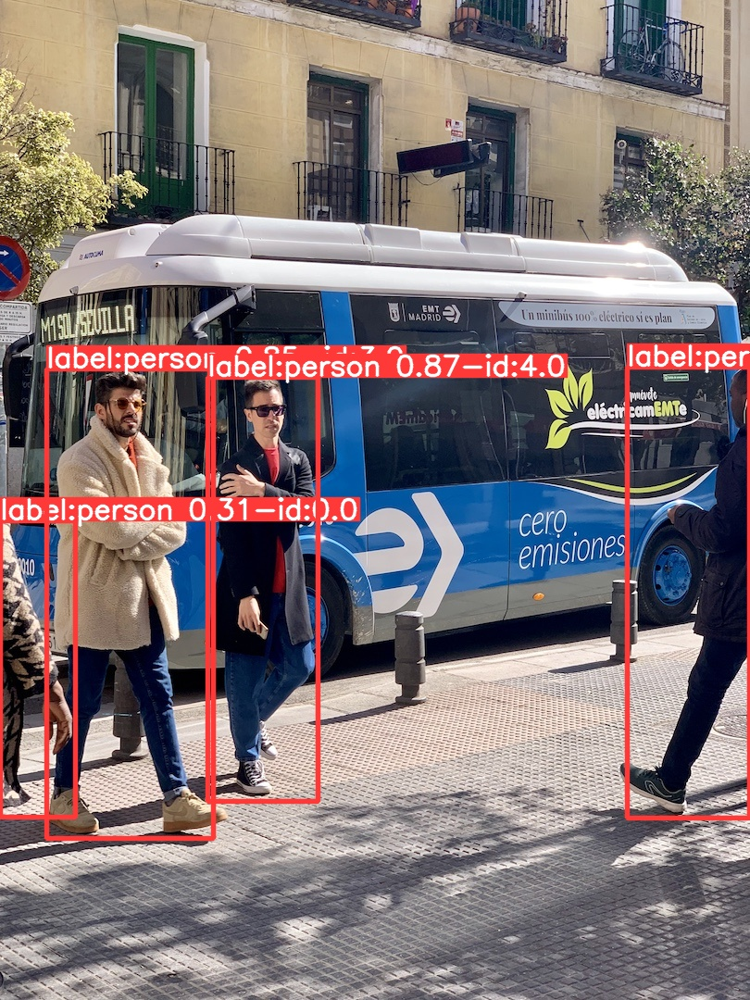

In [127]:
! rm -r runs/detect/*
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images
display.Image(filename='runs/detect/exp/bus.jpg', width=600) 

## This code captures a random part from the video to get a reference image to find some fixed points to transform the video into a different view. The points are later marked in red

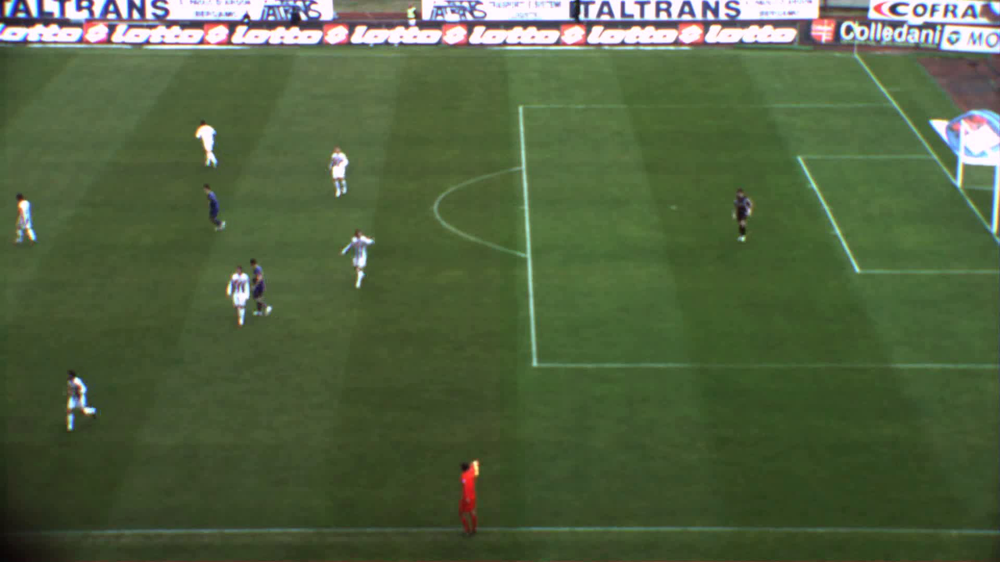

In [ ]:


myFrameNumber = 50
cap = cv2.VideoCapture("./data/videos/demo-s.mp4")

# get total number of frames
totalFrames = cap.get(cv2.CAP_PROP_FRAME_COUNT)

# check for valid frame number
if myFrameNumber >= 0 & myFrameNumber <= totalFrames:
    # set frame position
    cap.set(cv2.CAP_PROP_POS_FRAMES,myFrameNumber)

while cap.isOpened():
    ret, frame = cap.read()
    cv2_imshow(frame)
    break

cv2.destroyAllWindows()

In [ ]:
frame.shape

(1080, 1920, 3)

In [ ]:

circles1 = np.array([
        [10, 90], # Upper left
        [1640, 95], # Upper right
        [10, 1020], # Lower left
        [1900, 450], # Lower right
        ],np.float32)

In [ ]:
frame2 = frame.copy()

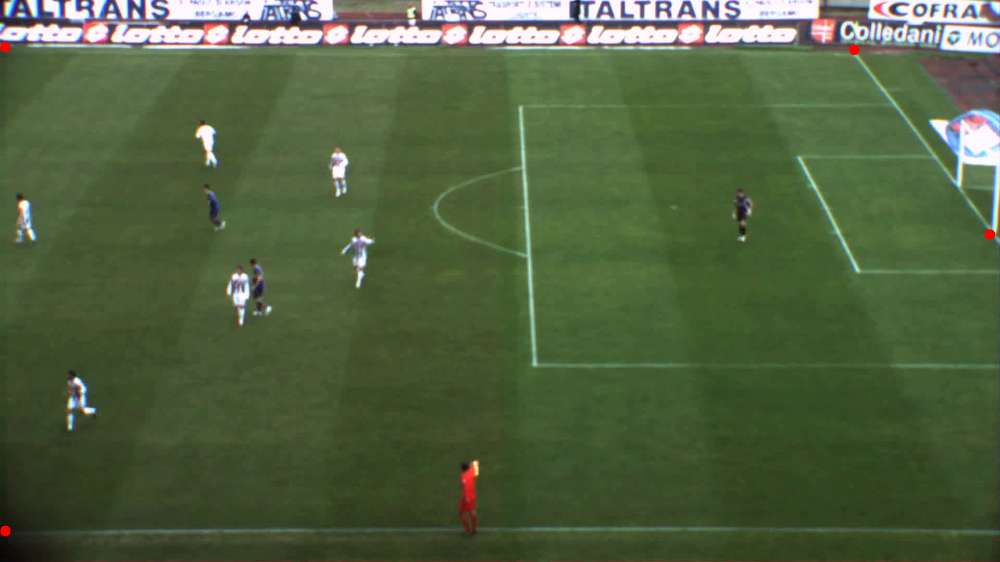

In [ ]:
for i in circles1:
  x, y = i
  frame2 = cv2.circle(frame2, (x,y), radius=10, color=(0, 0, 255), thickness=-1)

cv2_imshow(frame2)

## Download the soccer field image

In [ ]:
!wget -O field.jpg https://img.freepik.com/free-photo/soccer-field-from_68747-92.jpg?size=626&ext=jpg 

--2022-02-06 15:29:06--  https://img.freepik.com/free-photo/soccer-field-from_68747-92.jpg?size=626
Resolving img.freepik.com (img.freepik.com)... 23.218.110.19, 2600:1409:9800:68d::30ec, 2600:1409:9800:68f::30ec
Connecting to img.freepik.com (img.freepik.com)|23.218.110.19|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 74492 (73K) [image/jpeg]
Saving to: ‘field.jpg’

field.jpg           100%[===================>]  72.75K   236KB/s    in 0.3s    

2022-02-06 15:29:07 (236 KB/s) - ‘field.jpg’ saved [74492/74492]



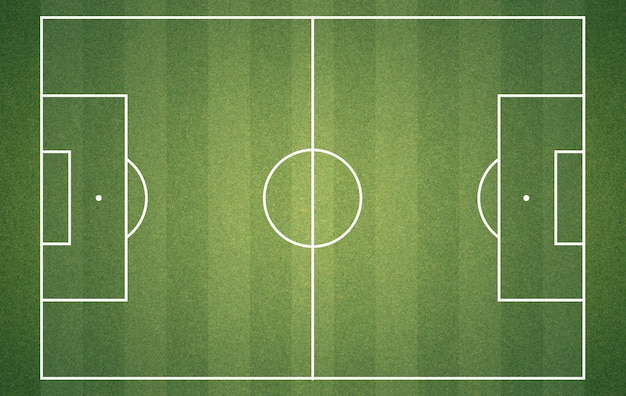

In [ ]:
field_img = cv2.imread('field.jpg')
cv2_imshow(field_img)

In [ ]:
field_img.shape

(396, 626, 3)

## These are how the transformed fixed points would like in the bird eye view of the original image

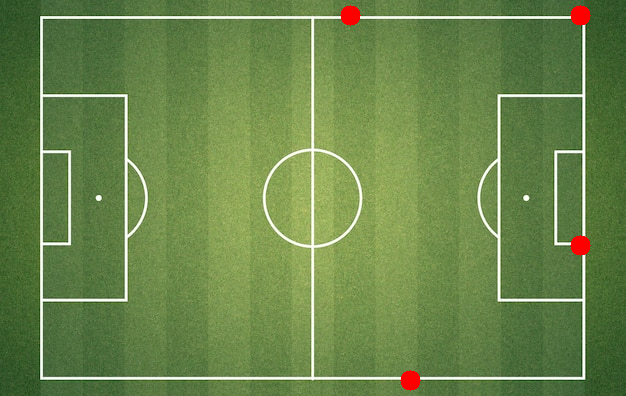

In [ ]:

circles2 = np.array([
        [350, 15], # Upper left
        [580, 15], # Upper right
        [410, 380], # Lower left
        [580, 245], # Lower right
        
                                   ], np.float32)

for i in circles2:
  x, y = i
  field_img = cv2.circle(field_img, (x,y), radius=10, color=(0, 0, 255), thickness=-1)
cv2_imshow(field_img)

In [ ]:
transformation_matrix = cv2.getPerspectiveTransform(circles1, circles2) 
transformation_matrix


array([[   0.089196,     0.51523,      336.49],
       [ -0.0042372,     0.84229,     -59.318],
       [-0.00011356,   0.0010841,           1]])

In [ ]:
frame.shape

(1080, 1920, 3)

## The mid point of the original frame image would be 

In [ ]:
np.float32(list(frame.shape[:-1]))/2.0

array([        540,         960], dtype=float32)

## If I take the mid point of the complete frame image, let us see where it gets reflected in the field_img

In [ ]:
cv2.perspectiveTransform(np.float32(np.array([[[960, 540]]])), transformation_matrix)

array([[[     474.35,      265.14]]], dtype=float32)

Rewriting field_img.shape to compare

In [ ]:
field_img.shape

(396, 626, 3)

## It comes at the green dot, which seems to be true!!

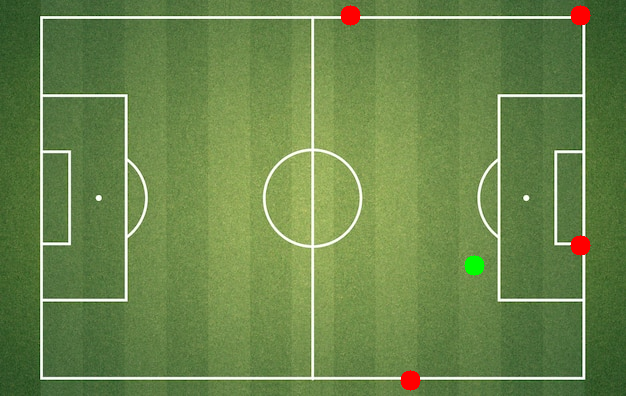

In [ ]:
field_img = cv2.circle(field_img, (474,265), radius=10, color=(0, 255, 0), thickness=-1)
cv2_imshow(field_img)

## I have incorporated the above changes in detect.py and added a sort algorithm


In [128]:
! rm -r runs/detect/*
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source ./data/videos/demo-s.mp4
# display.Image(filename='runs/detect/exp/zidane.jpg', width=600)

detect: weights=['yolov5s.pt'], source=./data/videos/demo-s.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-240-g45c0d89 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
video 1/1 (1/400) /content/yolov5/data/videos/demo-s.mp4: 384x640 13 persons, Done. (0.021s)
video 1/1 (2/400) /content/yolov5/data/videos/demo-s.mp4: 384x640 12 persons, Done. (0.014s)
video 1/1 (3/400) /content/yolov5/data/videos/demo-s.mp4: 384x640 12 persons, Done. (0.014s)
video 1/1 (4/400) /content/yolov5/data/videos/demo-s.mp4: 384x640 13 persons, Done. (0.016s)
video 1/1 (5/400) /content/yol

In [129]:
from IPython.display import HTML
from base64 import b64encode
import os


filepaths = ['runs/detect/exp/demo-s.mp4', 'video.mp4']

# Input video path
# save_path = "runs/detect/exp/demo-s.mp4"
htmlstr=''
for i, save_path in enumerate(filepaths):
  # Compressed video path
  compressed_path = f"/content/result_compressed_{i}.mp4"

  os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path} -y")

  # Show video
  mp4 = open(compressed_path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  htmlstr+= """
  <video width=600 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(htmlstr)

## Conclusion


1.   YoloV5 is quite accurate in tracking the ball and the players
2.   The unique ID generated for each player is changed more frequently.I did try using [DeepSort](https://github.com/nwojke/deep_sort) which is said to be a better version of SORT algorithm used here for object tracking. But even that didn't give me any promising results. Please let me know if you have any better object tracking algorithm.

## Uses of such tracking:
1. Analyzing gameplay paths for any player
2. Finding average speed of any player


